# Dataset Citation

The stock price data used in this notebook is sourced from the Kaggle dataset "All Stocks 5 Year Historical Data". The dataset can be accessed at the following link:

[All Stocks 5 Year Historical Data on Kaggle](https://www.kaggle.com/datasets/camnugent/sandp500)

Please cite the dataset as follows:

```
Nugent, C. (2018). All Stocks 5 Year Historical Data. Retrieved from https://www.kaggle.com/datasets/camnugent/sandp500
```
```

# Init

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
stock_dataset = pd.read_csv('data/all_stocks_5yr.csv')

stock_dataset['date'] = pd.to_datetime(stock_dataset['date']) # Convert the date from string to datetime format

stock_dataset

,date,open,high,low,close,volume,Name
0,2013-02-08,15.07,15.12,14.63,14.75,8407500,AAL
1,2013-02-11,14.89,15.01,14.26,14.46,8882000,AAL
2,2013-02-12,14.45,14.51,14.10,14.27,8126000,AAL
3,2013-02-13,14.30,14.94,14.25,14.66,10259500,AAL
4,2013-02-14,14.94,14.96,13.16,13.99,31879900,AAL
...,...,...,...,...,...,...,...
619035,2018-02-01,76.84,78.27,76.69,77.82,2982259,ZTS
619036,2018-02-02,77.53,78.12,76.73,76.78,2595187,ZTS
619037,2018-02-05,76.64,76.92,73.18,73.83,2962031,ZTS
619038,2018-02-06,72.74,74.56,72.13,73.27,4924323,ZTS


Initial lookup

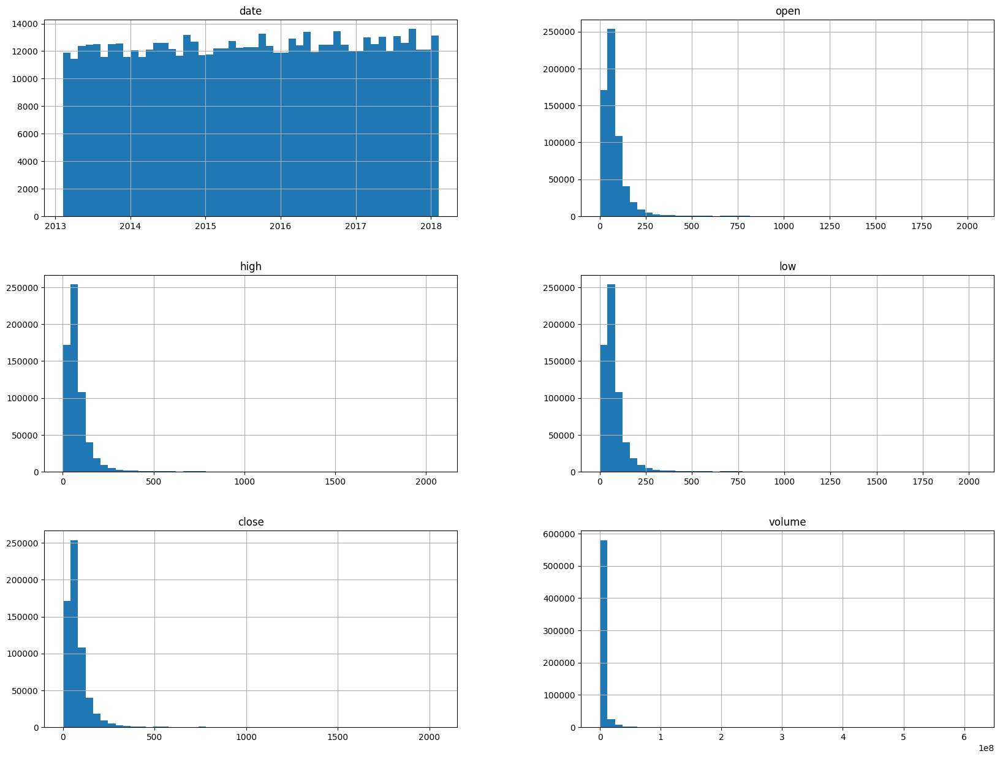

In [28]:
%matplotlib inline

stock_dataset.hist(bins=50, figsize=(20,15))

plt.show()

In [29]:
stock_dataset.isnull().sum()

date       0
open      11
high       8
low        8
close      0
volume     0
Name       0
dtype: int64

# train_test_split

In [30]:
from IPython.display import display

stock_dataset_sorted = stock_dataset.sort_values(by=['date']) # sort the data by date
stock_dataset_sorted.reset_index(drop=True, inplace=True) # reset the index

# perform 80-20 train-test split
train_set = stock_dataset_sorted[:int(0.8*len(stock_dataset_sorted))].copy()
test_set = stock_dataset_sorted[int(0.8*len(stock_dataset_sorted)):].copy()
# training data starts from the beginning and goes up to 80% of the data

display(train_set)
test_set

,date,open,high,low,close,volume,Name
0,2013-02-08,15.07,15.1200,14.630,14.75,8407500,AAL
1,2013-02-08,81.22,81.9300,80.940,81.89,296853,SLG
2,2013-02-08,78.24,79.0700,78.125,79.07,4632684,SLB
3,2013-02-08,236.64,238.6924,235.750,238.16,552207,BLK
4,2013-02-08,89.04,89.4800,88.910,89.16,554948,SJM
...,...,...,...,...,...,...,...
495227,2017-02-15,14.25,14.2800,14.095,14.22,8533307,HBAN
495228,2017-02-15,125.89,128.9704,125.890,128.44,4766864,AET
495229,2017-02-15,39.99,40.7200,39.890,40.40,3573418,INFO
495230,2017-02-15,48.01,48.3600,47.760,48.26,4298298,BBT


,date,open,high,low,close,volume,Name
495232,2017-02-15,54.09,54.15,53.57,53.93,6785537,MET
495233,2017-02-15,239.14,241.99,238.95,241.59,739729,NOC
495234,2017-02-15,109.00,110.06,108.77,109.66,2920281,MA
495235,2017-02-15,146.21,147.66,145.58,146.59,2248996,CI
495236,2017-02-15,126.28,127.92,125.37,127.76,2589522,PNC
...,...,...,...,...,...,...,...
619035,2018-02-07,53.38,54.36,52.94,52.97,6496219,CSX
619036,2018-02-07,107.46,109.48,106.56,106.63,1668253,ALB
619037,2018-02-07,10.75,11.04,10.70,10.76,68041787,F
619038,2018-02-07,176.25,180.99,176.00,177.47,5715671,AMGN


# Gaining insights

In [31]:
train_set.describe()

,date,open,high,low,close,volume
count,495232,495222.000000,495225.000000,495225.000000,495232.000000,4.952320e+05
mean,2015-02-17 14:25:37.315843840,78.541465,79.278648,77.793449,78.563713,4.395077e+06
min,2013-02-08 00:00:00,1.620000,1.690000,1.500000,1.590000,0.000000e+00
25%,2014-02-18 00:00:00,39.060000,39.450000,38.670000,39.080000,1.071248e+06
50%,2015-02-23 00:00:00,60.150000,60.750000,59.570000,60.180000,2.103939e+06
75%,2016-02-23 00:00:00,89.420000,90.220000,88.618200,89.460000,4.345214e+06
max,2017-02-15 00:00:00,1652.000000,1652.000000,1640.000000,1646.510000,6.182376e+08
std,NaN,87.649451,88.443121,86.799783,87.648245,8.906549e+06


Line plot of the stock price over time


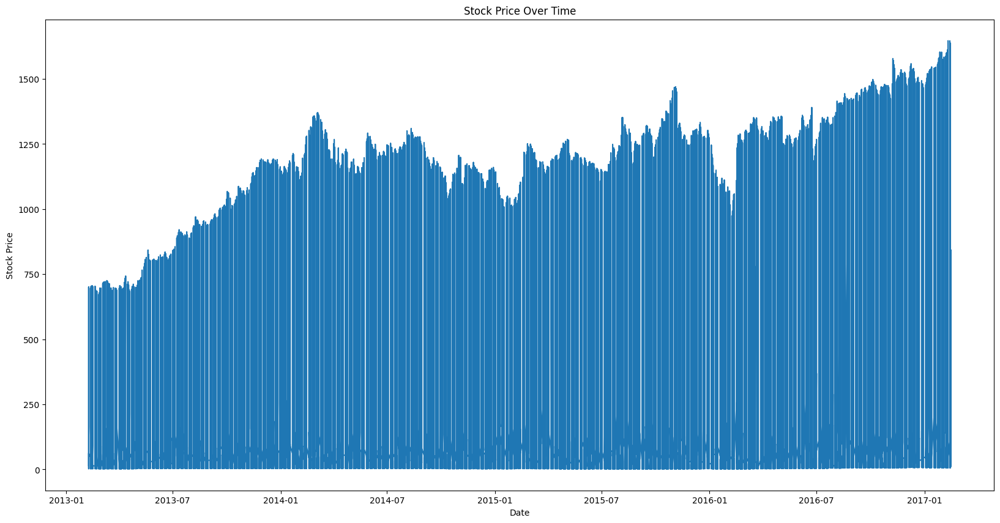

In [32]:
plt.figure(figsize=(20,10))
plt.plot(train_set['date'], train_set['close'])
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.title('Stock Price Over Time')
plt.show() # the stock price seems to be increasing over time

Box Plots: Identify outliers and understand the spread of the data.

In [33]:
import plotly.express as px

# Create an interactive box plot
fig = px.box(train_set, x='Name', y='close', title='Box Plot of Stock Prices by Stock Name')
fig.update_layout(xaxis_title='Stock Name', yaxis_title='Stock Price', xaxis_tickangle=-90)
fig.show() # PCLN is an obvious outlier. other noteworthy outliers are AZO, CMG, REGN, AMZN, GOOGL, AND GOOG

Correlation Matrix: Identify relationships between different features.

In [34]:
# correlation matrix
corr_matrix = train_set.select_dtypes(include=[np.number]).corr()
corr_matrix['close'].sort_values(ascending=False) # close price has negative correlation with volume. as stock price increases less people are buying the stock (seems obvious) a fewer investors are participating in the market. this could be due to the stock being overvalued or investors are waiting for a better price to buy the stock. 

close     1.000000
low       0.999930
high      0.999929
open      0.999853
volume   -0.145349
Name: close, dtype: float64

Before preprocessing

In [35]:
X_train = train_set.drop('close', axis=1).copy()
y_train = train_set['close'].copy()

X_train

# date - set as index
# numerical columns - fill missing values with the median and scale the data
# categorical columns - one-hot encode the data
# Name - Target encoding, as one-hot encoding would create too many columns

,date,open,high,low,volume,Name
0,2013-02-08,15.07,15.1200,14.630,8407500,AAL
1,2013-02-08,81.22,81.9300,80.940,296853,SLG
2,2013-02-08,78.24,79.0700,78.125,4632684,SLB
3,2013-02-08,236.64,238.6924,235.750,552207,BLK
4,2013-02-08,89.04,89.4800,88.910,554948,SJM
...,...,...,...,...,...,...
495227,2017-02-15,14.25,14.2800,14.095,8533307,HBAN
495228,2017-02-15,125.89,128.9704,125.890,4766864,AET
495229,2017-02-15,39.99,40.7200,39.890,3573418,INFO
495230,2017-02-15,48.01,48.3600,47.760,4298298,BBT


What to do with date column + other stuff

In [36]:
# create year, month, weekday, and day columns
# create lag columns for open, high, low, close, and volume. learning about past values helps the model predict future values
# try out simple, exponential, and weighted moving averages. rolling standard deviations, rolling variances, and rolling correlations, etc.
# create a column for the difference between the open and close prices for the day
# create a column for the difference between the high and low prices for the day
# seasonal patterns: monthly averages, weekly averages, etc.
# is it the start or end of the month, quarter, or year?
# is the stock price higher or lower than the previous day?
# is the stock price higher or lower than the previous week?
# is the stock price higher or lower than the previous month?
# is the stock price higher or lower than the moving average?
# technical indicators: RSI, MACD, Bollinger Bands, On-Balance Volume, etc.



# with time series data, the train-test split should be done in a way that respects the temporal order of the data (i.e. there's a cut-off date after which all data is in the test set). This is because we're trying to predict future values based on past values.

# Data Preprocessing

In [83]:
"""
This module contains a pipeline for preprocessing stock price data for machine learning models. 
It includes custom transformers for creating new features, scaling numerical features, and encoding categorical features.
Classes:
    CreateColumns(BaseEstimator, TransformerMixin): 
        Custom transformer to create new columns based on existing data.
    ToDataFrame(BaseEstimator, TransformerMixin): 
        Custom transformer to convert the transformed data back into a DataFrame.
Functions:
    fit(X, y=None): 
        Fits the transformer to the data.
    transform(X, y=None): 
        Transforms the data by creating new columns and filling missing values.
Variables:
    numerical_columns (list): 
        List of numerical columns to be used in the pipeline.
    new_columns (list): 
        List of new columns to be created by the CreateColumns transformer.
    categorical_columns (list): 
        List of categorical columns to be used in the pipeline.
    numerical_pipeline (Pipeline): 
        Pipeline for scaling numerical features.
    target_encoder (Pipeline): 
        Pipeline for encoding and scaling categorical features.
    transformer (ColumnTransformer): 
        Column transformer for applying different pipelines to numerical and categorical features.
    pipeline (Pipeline): 
        Final pipeline that includes creating new columns, transforming features, and converting to DataFrame.
Usage:
    X_train_prepared_df = pipeline.fit_transform(X_train, y_train)
"""

from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from category_encoders import TargetEncoder
from sklearn.base import BaseEstimator, TransformerMixin
import warnings
from pandas.errors import PerformanceWarning


# Suppress specific PerformanceWarning
warnings.filterwarnings('ignore', 'DataFrame is highly fragmented', PerformanceWarning)

# numerical columns
numerical_columns = ['open', 'high', 'low', 'volume']

# the columns we will create
new_columns = ['year', 'month', 'weekday', 'day', 'high_low_diff', 'monthly_avg', 'weekly_avg', 'monthly_avg_diff', 'weekly_avg_diff', 'rsi', 'macd', 'on_balance_volume', 'on_balance_volume_ema', 'bollinger_upper', 'bollinger_lower'] + [f'{column}_lag_{i}' for column in ['open', 'high', 'low', 'volume'] for i in range(1, 5)] + [f'{column}_sma_{i}' for column in numerical_columns for i in [5, 10, 20]] + [f'{column}_ema_{i}' for column in numerical_columns for i in [5, 10, 20]] + [f'{column}_wma_{i}' for column in numerical_columns for i in [5, 10, 20]] + [f'{column}_std_{i}' for column in numerical_columns for i in [5, 10, 20]] + [f'{column}_var_{i}' for column in numerical_columns for i in [5, 10, 20]] + [f'low_volume_corr_{i}' for i in range(1, 5)]

new_binary_columns = ['higher_than_prev_day', 'higher_than_prev_week', 'higher_than_prev_month', 'start_of_month', 'end_of_month', 'start_of_year', 'end_of_year'] # binary columns which doesn't need scaling, so we take them in a separate list


# categorical columns
categorical_columns = ['Name']


scaler = StandardScaler() # standard scaler for scaling the target variable

class CreateColumns(BaseEstimator, TransformerMixin): # custom transformer to create new columns


    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):

        X_copy = X.copy()
        

        X_copy['year'] = X_copy['date'].dt.year
        X_copy['month'] = X_copy['date'].dt.month
        X_copy['weekday'] = X_copy['date'].dt.weekday
        X_copy['day'] = X_copy['date'].dt.day

        # Convert date column to Unix timestamp for compatibility with float values in numpy arrays
        X_copy['date'] = pd.to_datetime(X_copy['date']).astype(int) / 10**9

        # we need to fill missing values before creating new columns
        for column in numerical_columns:
            X_copy[column] = X_copy[column].fillna(X_copy[column].median())
       
        # lag columns
        for column in ['open', 'high', 'low', 'volume']:
            for i in range(1, 5):
                X_copy[f'{column}_lag_{i}'] = X_copy[column].shift(i)

        X_copy['high_low_diff'] = X_copy['high'] - X_copy['low'] # difference between high and low prices

        # moving averages (simple, exponential, and weighted)
        for column in numerical_columns:

            X_copy[f'{column}_sma_5'] = X_copy[column].rolling(window=5).mean()
            X_copy[f'{column}_sma_10'] = X_copy[column].rolling(window=10).mean()
            X_copy[f'{column}_sma_20'] = X_copy[column].rolling(window=20).mean()
            X_copy[f'{column}_ema_5'] = X_copy[column].ewm(span=5, adjust=False).mean()
            X_copy[f'{column}_ema_10'] = X_copy[column].ewm(span=10, adjust=False).mean()
            X_copy[f'{column}_ema_20'] = X_copy[column].ewm(span=20, adjust=False).mean()
            X_copy[f'{column}_wma_5'] = X_copy[column].ewm(span=5, adjust=False).mean()
            X_copy[f'{column}_wma_10'] = X_copy[column].ewm(span=10, adjust=False).mean()
            X_copy[f'{column}_wma_20'] = X_copy[column].ewm(span=20, adjust=False).mean()
       
        # rolling standard deviations
        for column in numerical_columns:
            X_copy[f'{column}_std_5'] = X_copy[column].rolling(window=5).std()
            X_copy[f'{column}_std_10'] = X_copy[column].rolling(window=10).std()
            X_copy[f'{column}_std_20'] = X_copy[column].rolling(window=20).std()
        
        # rolling variances
        for column in numerical_columns:
            X_copy[f'{column}_var_5'] = X_copy[column].rolling(window=5).var()
            X_copy[f'{column}_var_10'] = X_copy[column].rolling(window=10).var()
            X_copy[f'{column}_var_20'] = X_copy[column].rolling(window=20).var()
        
        # as low is almost identical to close, we will use it to create new columns

        # rolling correlations
        for i in range(1, 5):
            X_copy[f'low_volume_corr_{i}'] = X_copy['low'].rolling(window=5).corr(X_copy['volume'].shift(i))


        # seasonal patterns
        X_copy['monthly_avg'] = X_copy.groupby('month')['low'].transform('mean')
        X_copy['weekly_avg'] = X_copy.groupby('weekday')['low'].transform('mean')
        X_copy['monthly_avg_diff'] = X_copy['low'] - X_copy['monthly_avg']
        X_copy['weekly_avg_diff'] = X_copy['low'] - X_copy['weekly_avg']
        X_copy['start_of_month'] = X_copy['day'].apply(lambda x: 1 if x < 5 else 0)
        X_copy['end_of_month'] = X_copy['day'].apply(lambda x: 1 if x > 25 else 0)
        X_copy['start_of_year'] = X_copy['day'].apply(lambda x: 1 if x < 10 else 0)
        X_copy['end_of_year'] = X_copy['day'].apply(lambda x: 1 if x > 20 else 0)
        X_copy['higher_than_prev_day'] = X_copy['low'] > X_copy['low'].shift(1)
        X_copy['higher_than_prev_week'] = X_copy['low'] > X_copy['low'].shift(5)
        X_copy['higher_than_prev_month'] = X_copy['low'] > X_copy['low'].shift(20)

        


        # technical indicators
        
        # RSI calculation
        delta = X_copy['low'].diff(1)
        gain = delta.where(delta > 0, 0)
        loss = -delta.where(delta < 0, 0)
        avg_gain = gain.rolling(window=14, min_periods=1).mean()
        avg_loss = loss.rolling(window=14, min_periods=1).mean()
        rs = avg_gain / avg_loss
        X_copy['rsi'] = 100 - (100 / (1 + rs))


        X_copy['macd'] = X_copy['low'].ewm(span=12, adjust=False).mean() - X_copy['low'].ewm(span=26, adjust=False).mean()
        - 2 * X_copy['low'].rolling(window=20).std()
        X_copy['on_balance_volume'] = X_copy['volume'].cumsum()
        X_copy['on_balance_volume_ema'] = X_copy['on_balance_volume'].ewm(span=20, adjust=False).mean()
        X_copy['bollinger_upper'] = X_copy['low'].rolling(window=20).mean() + 2 * X_copy['low'].rolling(window=20).std()
        X_copy['bollinger_lower'] = X_copy['low'].rolling(window=20).mean() 

        
        # fill missing values with the median
        null_columns = X_copy.columns[X_copy.isnull().any()]
        for col in null_columns:
            X_copy[col] = X_copy[col].fillna(X_copy[col].median())

        
        return X_copy
    

class ToDataFrame(BaseEstimator, TransformerMixin):
    
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        
        X_df = pd.DataFrame(X, columns=transformer.get_feature_names_out())
        X_df = X_df.astype(float)
        X_df.set_index('date', inplace=True)
        

        return X_df
    

# create a pipeline for numerical columns
numerical_pipeline = Pipeline([
    ('scaler', StandardScaler()),
])

# create a pipeline for categorical columns (Name)
target_encoder = Pipeline([
    ('encoder', TargetEncoder()),
    ('scaler', StandardScaler())
])

# create a pipeline for both
transformer = ColumnTransformer([
    ('numerical', numerical_pipeline, numerical_columns + new_columns),
    ('categorical', target_encoder, categorical_columns)
], remainder='passthrough', verbose_feature_names_out=False)


# create the final pipeline
pipeline = Pipeline([
    ('create_columns', CreateColumns()),
    ('transformer', transformer),
    ('to_dataframe', ToDataFrame())
])

y_train_prepared = scaler.fit_transform(y_train.values.reshape(-1, 1)).ravel() # scale the target variable

X_train_prepared_df = pipeline.fit_transform(X_train, y_train) # we pass the target variable to the fit_transform method to perform target encoding. the final output is a DataFrame with all the columns as standardized numerical values
X_train_prepared_df

,open,high,low,volume,year,month,weekday,day,high_low_diff,monthly_avg,...,low_volume_corr_3,low_volume_corr_4,Name,start_of_month,end_of_month,start_of_year,end_of_year,higher_than_prev_day,higher_than_prev_week,higher_than_prev_month
date,,,,,,,,,,,,,,,,,,,,,
1.360282e+09,-0.724155,-0.725425,-0.727694,0.450503,-1.396076,-1.32197,1.419102,-0.881279,-0.478368,-1.099183,...,-0.106003,-0.114816,-0.504841,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1.360282e+09,0.030564,0.029981,0.036254,-0.460136,-1.396076,-1.32197,1.419102,-0.881279,-0.238029,-1.099183,...,-0.106003,-0.114816,0.314097,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1.360282e+09,-0.003435,-0.002356,0.003823,0.026678,-1.396076,-1.32197,1.419102,-0.881279,-0.259659,-1.099183,...,-0.106003,-0.114816,0.074402,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1.360282e+09,1.803783,1.802461,1.819798,-0.431466,-1.396076,-1.32197,1.419102,-0.881279,0.700445,-1.099183,...,-0.106003,-0.114816,2.930143,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1.360282e+09,0.119784,0.115347,0.128075,-0.431158,-1.396076,-1.32197,1.419102,-0.881279,-0.439913,-1.099183,...,-0.106003,-0.114816,0.419437,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1.487117e+09,-0.733510,-0.734923,-0.733858,0.464628,2.029899,-1.32197,-0.009945,-0.078616,-0.624974,-1.099183,...,-1.213072,0.973449,-0.814326,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.487117e+09,0.540213,0.561857,0.554116,0.041743,2.029899,-1.32197,-0.009945,-0.078616,0.766778,-1.099183,...,1.484273,0.289818,0.163410,0.0,0.0,0.0,0.0,1.0,1.0,1.0
1.487117e+09,-0.439837,-0.435972,-0.436677,-0.092253,2.029899,-1.32197,-0.009945,-0.078616,-0.314937,-1.099183,...,1.438490,-0.381205,-0.577148,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Evaluate Algorithms

In [38]:
from sklearn.linear_model import LinearRegression, ElasticNet, SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor
from sklearn.model_selection import cross_val_predict, ShuffleSplit
from sklearn.metrics import mean_squared_error




# create a list of models to evaluate
models = [
    LinearRegression(),
    ElasticNet(),
    SGDRegressor(random_state=42),
    DecisionTreeRegressor(random_state=42),
    RandomForestRegressor(random_state=42),
    ExtraTreesRegressor(random_state=42),
    HistGradientBoostingRegressor(random_state=42),
    GradientBoostingRegressor(random_state=42),
    AdaBoostRegressor(random_state=42)
]


def rmse(y_true, y_pred): # the metric we will use to evaluate the models
    return np.sqrt(mean_squared_error(y_true, y_pred))


# evaluating on the entire training set is computationally expensive, so we will evaluate the models on 10% of the training set using cross-validation
shuffle_split = ShuffleSplit(n_splits=1, test_size=0.1, random_state=42)

# get the indices for the mini train set
for train_index, test_index in shuffle_split.split(X_train_prepared_df):
    X_train_prepared_df_mini = X_train_prepared_df.iloc[test_index] # taking the indices for the validation set for both X and y
    y_train_prepared_mini = y_train_prepared[test_index]


run_evaluate = False # a flag so we don't run the code by mistake

if run_evaluate:

    # evaluate the models
    for model in models:
        model_name = model.__class__.__name__
        y_pred = cross_val_predict(model, X_train_prepared_df_mini.to_numpy(), y_train_prepared_mini, cv=3)
        score = rmse(y_train_prepared_mini, y_pred)
        print(f'{model_name}: {score}')

# qualified models: SGDRegressor, RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor

# Tune hyperparameters for qualified models

In [39]:
from sklearn.model_selection import RandomizedSearchCV

# hyperparameter tuning for SGDRegressor
param_distributions_sgd = {
    'alpha': np.logspace(-4, -1, 10),
    'l1_ratio': np.linspace(0.1, 0.9, 9),
    'max_iter': np.arange(1000, 2001, 500)
}

sgd = SGDRegressor(random_state=42)
random_search_sgd = RandomizedSearchCV(sgd, param_distributions_sgd, n_iter=30, cv=3, scoring='neg_mean_squared_error', return_train_score=True, verbose=2, n_jobs=-1, random_state=42)

# hyperparameter tuning for ForestRegressors
param_distributions_forest = {
    'n_estimators': np.arange(50, 151, 50),
    'max_depth': np.arange(10, 31, 5),
    'max_features': ['sqrt']
}

rf = RandomForestRegressor(random_state=42)
et = ExtraTreesRegressor(random_state=42)
random_search_forest = RandomizedSearchCV(rf, param_distributions_forest, n_iter=30, cv=3, scoring='neg_mean_squared_error', return_train_score=True, verbose=2, n_jobs=-1, random_state=42)
random_search_et = RandomizedSearchCV(et, param_distributions_forest, n_iter=30, cv=3, scoring='neg_mean_squared_error', return_train_score=True, verbose=2, n_jobs=-1, random_state=42)

# hyperparameter tuning for GradientBoostingRegressor
param_distributions_gbr = {
    'n_estimators': np.arange(50, 151, 50),
    'max_depth': np.arange(3, 8, 2),
    'learning_rate': np.logspace(-2, 0, 3)
}

gb = GradientBoostingRegressor(random_state=42)
random_search_gbr = RandomizedSearchCV(gb, param_distributions_gbr, n_iter=30, cv=3, scoring='neg_mean_squared_error', return_train_score=True, verbose=2, n_jobs=-1, random_state=42)

run_hyper = False # a flag so we don't run the code by mistake

if run_hyper:
    # fit the models and print the best parameters and scores
    random_search_sgd.fit(X_train_prepared_df_mini, y_train_prepared_mini)
    print('SGDRegressor:', random_search_sgd.best_params_)
    print('SGDRegressor:', np.sqrt(-random_search_sgd.best_score_))

    random_search_forest.fit(X_train_prepared_df_mini, y_train_prepared_mini)
    print('RandomForestRegressor:', random_search_forest.best_params_)
    print('RandomForestRegressor:', np.sqrt(-random_search_forest.best_score_))

    random_search_et.fit(X_train_prepared_df_mini, y_train_prepared_mini)
    print('ExtraTreesRegressor:', random_search_et.best_params_)
    print('ExtraTreesRegressor:', np.sqrt(-random_search_et.best_score_))

    random_search_gbr.fit(X_train_prepared_df_mini, y_train_prepared_mini)
    print('GradientBoostingRegressor:', random_search_gbr.best_params_)
    print('GradientBoostingRegressor:', np.sqrt(-random_search_gbr.best_score_))

    # tuning doesnt seem to help at all so we will go with the default hyperparameters. the models perform good enough anyways so lets not sweat it

# Building an ensemble model from the best performing models

In [70]:
from sklearn.ensemble import VotingRegressor


vote_reg = VotingRegressor([ # this one has the best performance ive seen so far
    ('sgd', SGDRegressor(random_state=42)),
    ('et', ExtraTreesRegressor(random_state=42, n_jobs=-1)),
])


run_ensemble = False # a flag so we don't run the code by mistake

if run_ensemble:
    
    y_pred = cross_val_predict(vote_reg, X_train_prepared_df_mini.to_numpy(), y_train_prepared_mini, cv=3, n_jobs=-1)
    print(f'VotingRegressor: {rmse(y_train_prepared_mini, y_pred)}')

fit = False
if fit:
    vote_reg.fit(X_train_prepared_df.to_numpy(), y_train_prepared)


VotingRegressor: 0.012220952707012032


VotingRegressor(estimators=[('sgd', SGDRegressor(random_state=42)),
                            ('et',
                             ExtraTreesRegressor(n_jobs=-1, random_state=42))])

# Final Evaluation on Test Set

In [84]:
X_test = test_set.drop('close', axis=1).copy()
y_test = test_set['close'].copy()

y_test_prepared = scaler.transform(y_test.values.reshape(-1, 1)).ravel()
X_test_prepared_df = pipeline.transform(X_test)

y_pred = vote_reg.predict(X_test_prepared_df.to_numpy())

print(f'VotingRegressor: {rmse(y_test_prepared, y_pred)}') # im satisfied

VotingRegressor: 0.06735379160615382


Save the model

In [94]:
# import joblib

# joblib.dump(vote_reg, 'stock_price_prediction.pkl') # 6GB file

['stock_price_prediction.pkl']